<a href="https://colab.research.google.com/github/RobertSloan22/LTSM--TimeSeries-Predicting/blob/main/LTSM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [83]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [84]:
!pip install scikeras


In [86]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn import model_selection
from sklearn.compose import ColumnTransformer
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
import warnings
import os
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from scikeras.wrappers import KerasClassifier
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dense, Input, Dropout,BatchNormalization
from tensorflow import keras
from tensorflow.keras import layers
import random
from tensorflow.keras import backend


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow import keras

In [96]:
import pandas as pd

# Read the Excel file
df = pd.read_csv('/content/drive/MyDrive/NovakCryptoWork/cat_df.csv')

# Display the first few rows of the DataFrame
print(df.head())



   Unnamed: 0                   timestamp    rune_id           rune_name  \
0          13  2024-06-12 01:41:21.786+00  845764:84  BILLION•DOLLAR•CAT   
1         855  2024-06-12 01:46:28.852+00  845764:84  BILLION•DOLLAR•CAT   
2        1700  2024-06-12 01:51:24.234+00  845764:84  BILLION•DOLLAR•CAT   
3        2544  2024-06-12 01:56:22.337+00  845764:84  BILLION•DOLLAR•CAT   
4        3385  2024-06-12 02:01:20.195+00  845764:84  BILLION•DOLLAR•CAT   

   marketcap_usd  rune_number symbol         etching_time  \
0     26399135.8        72029      🐱  2024-05-30 07:41:45   
1     26399135.8        72029      🐱  2024-05-30 07:41:45   
2     26399135.8        72029      🐱  2024-05-30 07:41:45   
3     26399135.8        72029      🐱  2024-05-30 07:41:45   
4     26399135.8        72029      🐱  2024-05-30 07:41:45   

                                             etching  inscription_id  ...  \
0  c5e59f3f8024c80fe7f8685c1d920f66cee5e9d4a423f3...             NaN  ...   
1  c5e59f3f8024c80fe7f

In [ ]:
cat_df = df[df['rune_name']=='BILLION•DOLLAR•CAT']
cat_df.to_csv('/content/drive/MyDrive/NovakCryptoWork/cat_df.csv')


In [98]:
df.head()

,Unnamed: 0,timestamp,rune_id,rune_name,marketcap_usd,rune_number,symbol,etching_time,etching,inscription_id,...,listings_max_price,listings_avg_price,listings_percentile_25,listings_median_price,listings_percentile_75,count_listings,listings_total_quantity,balance_change_last_1_block,balance_change_last_3_blocks,balance_change_last_10_blocks
0,13,2024-06-12 01:41:21.786+00,845764:84,BILLION•DOLLAR•CAT,26399135.8,72029,🐱,2024-05-30 07:41:45,c5e59f3f8024c80fe7f8685c1d920f66cee5e9d4a423f3...,NaN,...,10000.0,171.633103,45.000000,50.0,67.0,263,5930369.0,97500.0,1405878.0,4353104.0
1,855,2024-06-12 01:46:28.852+00,845764:84,BILLION•DOLLAR•CAT,26399135.8,72029,🐱,2024-05-30 07:41:45,c5e59f3f8024c80fe7f8685c1d920f66cee5e9d4a423f3...,NaN,...,10000.0,171.650213,45.000000,50.0,67.0,263,6096787.0,97500.0,1405878.0,4353104.0
2,1700,2024-06-12 01:51:24.234+00,845764:84,BILLION•DOLLAR•CAT,26399135.8,72029,🐱,2024-05-30 07:41:45,c5e59f3f8024c80fe7f8685c1d920f66cee5e9d4a423f3...,NaN,...,10000.0,171.621696,45.000000,50.0,67.0,263,6199319.0,797300.0,1287384.0,5100404.0
3,2544,2024-06-12 01:56:22.337+00,845764:84,BILLION•DOLLAR•CAT,26399135.8,72029,🐱,2024-05-30 07:41:45,c5e59f3f8024c80fe7f8685c1d920f66cee5e9d4a423f3...,NaN,...,10000.0,171.854221,44.799972,50.0,67.0,262,6091440.0,312214.0,1207014.0,4970218.0
4,3385,2024-06-12 02:01:20.195+00,845764:84,BILLION•DOLLAR•CAT,26399135.8,72029,🐱,2024-05-30 07:41:45,c5e59f3f8024c80fe7f8685c1d920f66cee5e9d4a423f3...,NaN,...,10000.0,172.056412,45.000000,50.0,67.0,262,6103523.0,369548.0,1264348.0,5027552.0


In [99]:
df.tail()

,Unnamed: 0,timestamp,rune_id,rune_name,marketcap_usd,rune_number,symbol,etching_time,etching,inscription_id,...,listings_max_price,listings_avg_price,listings_percentile_25,listings_median_price,listings_percentile_75,count_listings,listings_total_quantity,balance_change_last_1_block,balance_change_last_3_blocks,balance_change_last_10_blocks
2370,2996445,2024-06-26 18:55:03.945+00,845764:84,BILLION•DOLLAR•CAT,5.006004e+07,72029,🐱,2024-05-30 07:41:45,c5e59f3f8024c80fe7f8685c1d920f66cee5e9d4a423f3...,NaN,...,200.0,115.350137,82.299976,100.0,140.0,298,4602385.0,6200.0,78710.0,534476.0
2371,2997637,2024-06-26 18:59:58.156+00,845764:84,BILLION•DOLLAR•CAT,5.006004e+07,72029,🐱,2024-05-30 07:41:45,c5e59f3f8024c80fe7f8685c1d920f66cee5e9d4a423f3...,NaN,...,200.0,115.374332,82.300000,100.0,140.0,298,4617449.0,6200.0,78710.0,534476.0
2372,2998830,2024-06-26 19:04:55.076+00,845764:84,BILLION•DOLLAR•CAT,5.006004e+07,72029,🐱,2024-05-30 07:41:45,c5e59f3f8024c80fe7f8685c1d920f66cee5e9d4a423f3...,NaN,...,200.0,115.397887,82.300000,100.0,140.0,298,4646299.0,0.0,10840.0,121858.0
2373,2998898,2024-06-26 19:04:55.076+00,845764:84,BILLION•DOLLAR•CAT,5.006004e+07,72029,🐱,2024-05-30 07:41:45,c5e59f3f8024c80fe7f8685c1d920f66cee5e9d4a423f3...,NaN,...,200.0,115.397887,82.300000,100.0,140.0,298,4646299.0,0.0,10840.0,121858.0
2374,3002358,2024-06-26 19:15:01.536+00,845764:84,BILLION•DOLLAR•CAT,5.006004e+07,72029,🐱,2024-05-30 07:41:45,c5e59f3f8024c80fe7f8685c1d920f66cee5e9d4a423f3...,NaN,...,200.0,115.274363,81.950027,100.0,140.0,298,4628167.0,0.0,6152.0,89502.0


In [ ]:
import pandas as pd

# Read the Excel file
df = pd.read_csv('/content/drive/MyDrive/ProcessedRunesData/rune_data_BILLION•DOLLAR•CAT.csv')

# Display the first few rows of the DataFrame
print(df.head())



                    timestamp    rune_id           rune_name  marketcap_usd  \
0  2024-06-12 01:41:21.786+00  845764:84  BILLION•DOLLAR•CAT     26399135.8   
1  2024-06-12 01:46:28.852+00  845764:84  BILLION•DOLLAR•CAT     26399135.8   
2  2024-06-12 01:51:24.234+00  845764:84  BILLION•DOLLAR•CAT     26399135.8   
3  2024-06-12 01:56:22.337+00  845764:84  BILLION•DOLLAR•CAT     26399135.8   
4  2024-06-12 02:01:20.195+00  845764:84  BILLION•DOLLAR•CAT     26399135.8   

   rune_number symbol         etching_time  \
0        72029      🐱  2024-05-30 07:41:45   
1        72029      🐱  2024-05-30 07:41:45   
2        72029      🐱  2024-05-30 07:41:45   
3        72029      🐱  2024-05-30 07:41:45   
4        72029      🐱  2024-05-30 07:41:45   

                                             etching  inscription_id  turbo  \
0  c5e59f3f8024c80fe7f8685c1d920f66cee5e9d4a423f3...             NaN   True   
1  c5e59f3f8024c80fe7f8685c1d920f66cee5e9d4a423f3...             NaN   True   
2  c5e59f3f

In [100]:
df.describe()

,Unnamed: 0,marketcap_usd,rune_number,inscription_id,amount,supply,burned,premine,minted,mints,...,listings_max_price,listings_avg_price,listings_percentile_25,listings_median_price,listings_percentile_75,count_listings,listings_total_quantity,balance_change_last_1_block,balance_change_last_3_blocks,balance_change_last_10_blocks
count,2.375000e+03,2.375000e+03,2375.0,0.0,2375.0,2.375000e+03,2375.0,2375.0,2.375000e+03,2375.0,...,2375.000000,2375.000000,2375.000000,2375.000000,2375.000000,2375.000000,2.375000e+03,2.375000e+03,2.375000e+03,2.375000e+03
mean,1.402244e+06,4.670099e+07,72029.0,NaN,25000.0,1.000000e+09,0.0,0.0,1.000000e+09,40000.0,...,1437.980682,132.024449,80.313305,99.182979,133.480286,296.670316,4.431786e+06,6.237008e+05,1.882308e+06,5.528871e+06
std,8.932557e+05,1.088751e+07,0.0,NaN,0.0,0.000000e+00,0.0,0.0,0.000000e+00,0.0,...,3096.690918,51.051537,17.593532,20.761465,29.438803,5.412039,1.309529e+06,1.859930e+06,4.055040e+06,7.269230e+06
min,1.300000e+01,2.639914e+07,72029.0,NaN,25000.0,1.000000e+09,0.0,0.0,1.000000e+09,40000.0,...,150.000000,60.549205,44.000000,48.900000,63.000000,262.000000,1.878862e+06,0.000000e+00,0.000000e+00,8.950200e+04
25%,5.962975e+05,3.771354e+07,72029.0,NaN,25000.0,1.000000e+09,0.0,0.0,1.000000e+09,40000.0,...,200.000000,107.589715,64.900000,85.000000,123.995000,298.000000,3.438492e+06,2.159700e+04,2.684180e+05,1.441881e+06
50%,1.363932e+06,4.695230e+07,72029.0,NaN,25000.0,1.000000e+09,0.0,0.0,1.000000e+09,40000.0,...,242.000000,119.048432,80.000000,100.000000,139.000000,298.000000,4.329324e+06,1.609040e+05,7.054780e+05,2.818822e+06
75%,2.168048e+06,5.355554e+07,72029.0,NaN,25000.0,1.000000e+09,0.0,0.0,1.000000e+09,40000.0,...,333.000000,138.825447,93.000000,113.000000,140.000000,298.000000,5.041878e+06,5.513760e+05,1.677039e+06,5.631324e+06
max,3.002358e+06,7.380477e+07,72029.0,NaN,25000.0,1.000000e+09,0.0,0.0,1.000000e+09,40000.0,...,10000.000000,411.284973,119.300000,140.000000,297.000000,298.000000,1.037937e+07,3.292167e+07,4.143966e+07,4.842878e+07


In [101]:
df.dtypes

Unnamed: 0                         int64
timestamp                         object
rune_id                           object
rune_name                         object
marketcap_usd                    float64
rune_number                        int64
symbol                            object
etching_time                      object
etching                           object
inscription_id                   float64
turbo                               bool
amount                           float64
supply                           float64
burned                           float64
premine                          float64
minted                           float64
mints                              int64
holders                            int64
price_sats                       float64
price_usd                        float64
price_change                     float64
volume_1h_btc                    float64
volume_1d_btc                    float64
volume_7d_btc                    float64
volume_total_btc

In [ ]:
# prompt: create a pair plot

sns.pairplot(df)
plt.show()


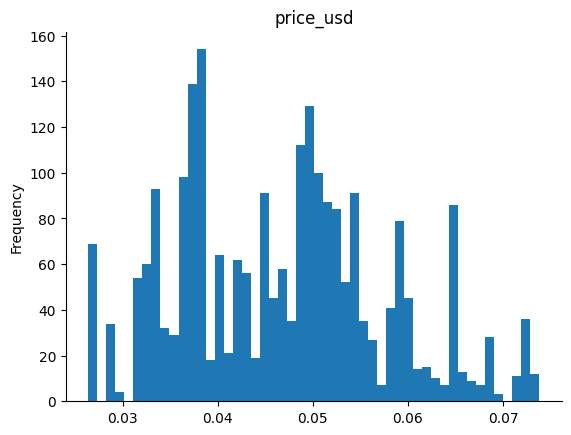

In [106]:
from matplotlib import pyplot as plt
df['price_usd'].plot(kind='hist', bins=50, title='price_usd')
plt.gca().spines[['top', 'right',]].set_visible(False)

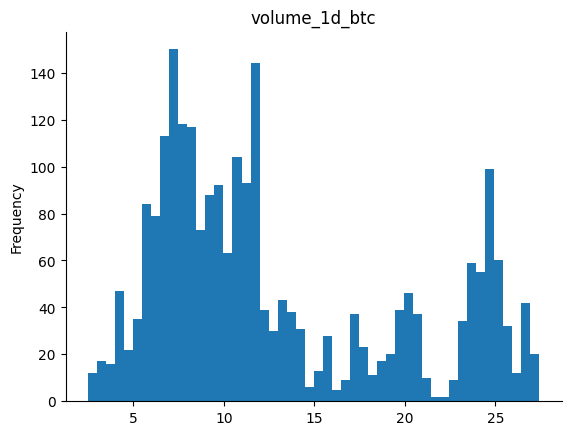

In [105]:
from matplotlib import pyplot as plt
df['volume_1d_btc'].plot(kind='hist', bins=50, title='volume_1d_btc')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df['volume_1d_btc'].plot(kind='hist', bins=20, title='volume_1d_btc')
plt.gca().spines[['top', 'right',]].set_visible(False)

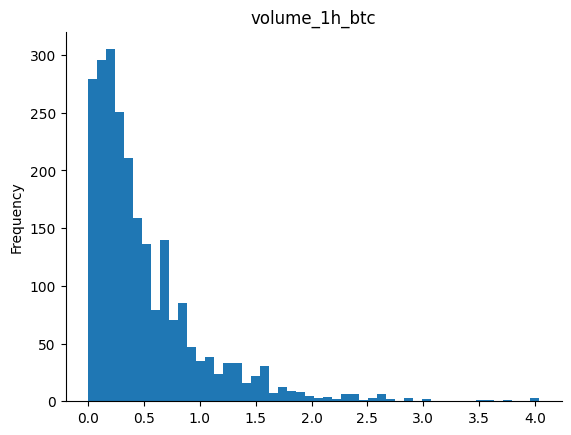

In [104]:
from matplotlib import pyplot as plt
df['volume_1h_btc'].plot(kind='hist', bins=50, title='volume_1h_btc')
plt.gca().spines[['top', 'right',]].set_visible(False)

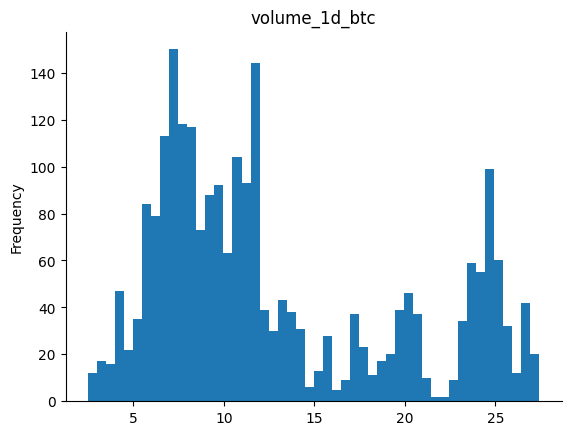

In [103]:
from matplotlib import pyplot as plt
df['volume_1d_btc'].plot(kind='hist', bins=50, title='volume_1d_btc')
plt.gca().spines[['top', 'right',]].set_visible(False)

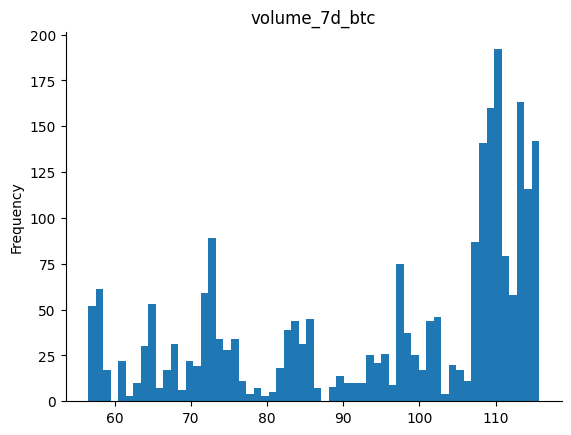

In [102]:
from matplotlib import pyplot as plt
df['volume_7d_btc'].plot(kind='hist', bins=60, title='volume_7d_btc')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [107]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2375 entries, 0 to 2374
Data columns (total 46 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Unnamed: 0                     2375 non-null   int64  
 1   timestamp                      2375 non-null   object 
 2   rune_id                        2375 non-null   object 
 3   rune_name                      2375 non-null   object 
 4   marketcap_usd                  2375 non-null   float64
 5   rune_number                    2375 non-null   int64  
 6   symbol                         2375 non-null   object 
 7   etching_time                   2375 non-null   object 
 8   etching                        2375 non-null   object 
 9   inscription_id                 0 non-null      float64
 10  turbo                          2375 non-null   bool   
 11  amount                         2375 non-null   float64
 12  supply                         2375 non-null   f

In [108]:
df = df.drop(['amount', 'supply',	'burned',	'premine',	'minted',	'mints'], axis=1 )

In [110]:
df = df.drop(['inscription_id', 'etching_time'], axis=1 )

In [111]:
df.isnull().sum()

Unnamed: 0                       0
timestamp                        0
rune_id                          0
rune_name                        0
marketcap_usd                    0
rune_number                      0
symbol                           0
etching                          0
turbo                            0
holders                          0
price_sats                       0
price_usd                        0
price_change                     0
volume_1h_btc                    0
volume_1d_btc                    0
volume_7d_btc                    0
volume_total_btc                 0
sales_1h                         0
sales_1d                         0
sales_7d                         0
sales_total                      0
sellers_1h                       0
sellers_1d                       0
sellers_7d                       0
buyers_1h                        0
buyers_1d                        0
buyers_7d                        0
listings_min_price               0
listings_max_price  

In [112]:
df.shape

(2375, 38)

In [114]:
df.drop(['rune_number', 'etching', 'turbo', 'rune_id', 'symbol'], axis=1, inplace=True)

In [115]:
df.nunique()

Unnamed: 0                       2375
timestamp                        2302
rune_name                           1
marketcap_usd                     443
holders                           402
price_sats                        400
price_usd                         443
price_change                      405
volume_1h_btc                    1060
volume_1d_btc                    1079
volume_7d_btc                    1101
volume_total_btc                  758
sales_1h                          174
sales_1d                          734
sales_7d                          887
sales_total                       758
sellers_1h                         80
sellers_1d                        336
sellers_7d                        355
buyers_1h                          82
buyers_1d                         361
buyers_7d                         436
listings_min_price                593
listings_max_price                 57
listings_avg_price               2211
listings_percentile_25            341
listings_med

In [116]:
df.head()

,Unnamed: 0,timestamp,rune_name,marketcap_usd,holders,price_sats,price_usd,price_change,volume_1h_btc,volume_1d_btc,...,listings_max_price,listings_avg_price,listings_percentile_25,listings_median_price,listings_percentile_75,count_listings,listings_total_quantity,balance_change_last_1_block,balance_change_last_3_blocks,balance_change_last_10_blocks
0,13,2024-06-12 01:41:21.786+00,BILLION•DOLLAR•CAT,26399135.8,2357,38.0,0.026399,0.096365,0.412937,10.376056,...,10000.0,171.633103,45.000000,50.0,67.0,263,5930369.0,97500.0,1405878.0,4353104.0
1,855,2024-06-12 01:46:28.852+00,BILLION•DOLLAR•CAT,26399135.8,2357,38.0,0.026399,0.096365,0.412937,10.376056,...,10000.0,171.650213,45.000000,50.0,67.0,263,6096787.0,97500.0,1405878.0,4353104.0
2,1700,2024-06-12 01:51:24.234+00,BILLION•DOLLAR•CAT,26399135.8,2357,38.0,0.026399,0.096365,0.374305,10.458668,...,10000.0,171.621696,45.000000,50.0,67.0,263,6199319.0,797300.0,1287384.0,5100404.0
3,2544,2024-06-12 01:56:22.337+00,BILLION•DOLLAR•CAT,26399135.8,2357,38.0,0.026399,0.096365,0.374305,10.458668,...,10000.0,171.854221,44.799972,50.0,67.0,262,6091440.0,312214.0,1207014.0,4970218.0
4,3385,2024-06-12 02:01:20.195+00,BILLION•DOLLAR•CAT,26399135.8,2357,38.0,0.026399,0.096365,0.374305,10.458668,...,10000.0,172.056412,45.000000,50.0,67.0,262,6103523.0,369548.0,1264348.0,5027552.0


In [117]:
df.tail()

,Unnamed: 0,timestamp,rune_name,marketcap_usd,holders,price_sats,price_usd,price_change,volume_1h_btc,volume_1d_btc,...,listings_max_price,listings_avg_price,listings_percentile_25,listings_median_price,listings_percentile_75,count_listings,listings_total_quantity,balance_change_last_1_block,balance_change_last_3_blocks,balance_change_last_10_blocks
2370,2996445,2024-06-26 18:55:03.945+00,BILLION•DOLLAR•CAT,5.006004e+07,5353,81.999273,0.05006,-0.036015,0.205034,5.702685,...,200.0,115.350137,82.299976,100.0,140.0,298,4602385.0,6200.0,78710.0,534476.0
2371,2997637,2024-06-26 18:59:58.156+00,BILLION•DOLLAR•CAT,5.006004e+07,5353,81.999273,0.05006,-0.036015,0.205034,5.702685,...,200.0,115.374332,82.300000,100.0,140.0,298,4617449.0,6200.0,78710.0,534476.0
2372,2998830,2024-06-26 19:04:55.076+00,BILLION•DOLLAR•CAT,5.006004e+07,5352,81.999273,0.05006,-0.036015,0.085120,5.450325,...,200.0,115.397887,82.300000,100.0,140.0,298,4646299.0,0.0,10840.0,121858.0
2373,2998898,2024-06-26 19:04:55.076+00,BILLION•DOLLAR•CAT,5.006004e+07,5352,81.999273,0.05006,-0.036015,0.085120,5.450325,...,200.0,115.397887,82.300000,100.0,140.0,298,4646299.0,0.0,10840.0,121858.0
2374,3002358,2024-06-26 19:15:01.536+00,BILLION•DOLLAR•CAT,5.006004e+07,5353,81.999273,0.05006,-0.036015,0.023872,5.400379,...,200.0,115.274363,81.950027,100.0,140.0,298,4628167.0,0.0,6152.0,89502.0


In [118]:
titles = [
    "Market Cap (USD)", "Holders", "Price (Sats)", "Price (USD)", "Price Change",
    "Volume (1h BTC)", "Volume (1d BTC)", "Volume (7d BTC)", "Volume Total BTC",
    "Sales (1h)", "Sales (1d)", "Sales (7d)", "Sellers (1h)", "Sellers (1d)",
    "Sellers (7d)", "Buyers (1h)", "Buyers (1d)", "Buyers (7d)", "Listings Min Price",
    "Listings Max Price", "Listings Avg Price", "Listings Percentile 25",
    "Listings Median Price", "Listings Percentile 75", "Count Listings",
    "Listings Total Quantity", "Balance Change Last 1 Block",
    "Balance Change Last 3 Blocks", "Balance Change Last 10 Blocks"
]

feature_keys = [
    "marketcap_usd", "holders", "price_sats", "price_usd", "price_change",
    "volume_1h_btc", "volume_1d_btc", "volume_7d_btc", "volume_total_btc",
    "sales_1h", "sales_1d", "sales_7d", "sellers_1h", "sellers_1d", "sellers_7d",
    "buyers_1h", "buyers_1d", "buyers_7d", "listings_min_price", "listings_max_price",
    "listings_avg_price", "listings_percentile_25", "listings_median_price",
    "listings_percentile_75", "count_listings", "listings_total_quantity",
    "balance_change_last_1_block", "balance_change_last_3_blocks",
    "balance_change_last_10_blocks"
]

colors = [
    "blue", "orange", "green", "red", "purple", "brown", "pink", "gray", "olive", "cyan",
    "blue", "orange", "green", "red", "purple", "brown", "pink", "gray", "olive", "cyan",
    "blue", "orange", "green", "red", "purple", "brown", "pink", "gray", "olive", "cyan"
]

date_time_key = "timestamp"


In [119]:
# Normalize the data
def normalize(data, train_split):
    data_mean = data[:train_split].mean(axis=0)
    data_std = data[:train_split].std(axis=0)
    data_std[data_std == 0] = 1  # Prevent division by zero
    return (data - data_mean) / data_std

print("The selected parameters are:", ", ".join(titles))
selected_features = feature_keys
features = df[selected_features]
features.index = df[date_time_key]
features.head()

features = normalize(features.values, train_split)
features = pd.DataFrame(features, columns=selected_features)
features.head()

train_data = features.loc[0 : train_split - 1]
val_data = features.loc[train_split:]

# Ensure start and end indices are correctly calculated
start = past
end = train_split

x_train = train_data.values
y_train = features.iloc[start:end][["price_usd"]]

sequence_length = int(past / step)

dataset_train = keras.preprocessing.timeseries_dataset_from_array(
    x_train,
    y_train,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

# Verify the lengths of validation data
print("Validation data length:", len(val_data))
x_end = len(val_data) - past - future
print("x_end:", x_end)

# Ensure label_start is within bounds and get the correct slice of validation data
label_start = train_split + past
label_end = len(features)  # End index for validation labels
print("label_start:", label_start)
print("label_end:", label_end)

# Debug: Check the ranges for x_val and y_val
if x_end > 0 and label_start < label_end:
    x_val = val_data.iloc[:x_end].values
    y_val = features.iloc[label_start:label_end][["price_usd"]].values  # Slice y_val up to the end

    dataset_val = keras.preprocessing.timeseries_dataset_from_array(
        x_val,
        y_val,
        sequence_length=sequence_length,
        sampling_rate=step,
        batch_size=batch_size,
    )

    # Verify that dataset_val is not empty
    print("Number of batches in validation dataset:", len(dataset_val))
    for batch in dataset_val.take(1):
        inputs, targets = batch
        print("Validation Input shape:", inputs.numpy().shape)
        print("Validation Target shape:", targets.numpy().shape)
else:
    print("Insufficient validation data for the given parameters.")


The selected parameters are: Market Cap (USD), Holders, Price (Sats), Price (USD), Price Change, Volume (1h BTC), Volume (1d BTC), Volume (7d BTC), Volume Total BTC, Sales (1h), Sales (1d), Sales (7d), Sellers (1h), Sellers (1d), Sellers (7d), Buyers (1h), Buyers (1d), Buyers (7d), Listings Min Price, Listings Max Price, Listings Avg Price, Listings Percentile 25, Listings Median Price, Listings Percentile 75, Count Listings, Listings Total Quantity, Balance Change Last 1 Block, Balance Change Last 3 Blocks, Balance Change Last 10 Blocks
Validation data length: 677
x_end: 477
label_start: 1798
label_end: 2375
Number of batches in validation dataset: 2
Validation Input shape: (256, 20, 29)
Validation Target shape: (256, 1)


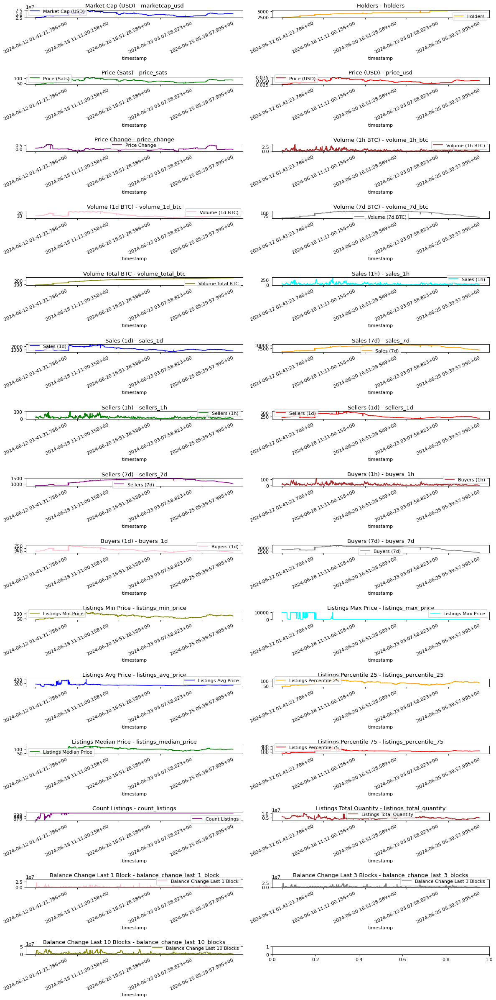

In [120]:
def show_raw_visualization(data):
    time_data = data[date_time_key]
    fig, axes = plt.subplots(
        nrows=15, ncols=2, figsize=(15, 30), dpi=80, facecolor="w", edgecolor="k"
    )
    for i in range(len(feature_keys)):
        key = feature_keys[i]
        c = colors[i % len(colors)]
        t_data = data[key]
        t_data.index = time_data
        t_data.head()
        ax = t_data.plot(
            ax=axes[i // 2, i % 2],
            color=c,
            title="{} - {}".format(titles[i], key),
            rot=25,
        )
        ax.legend([titles[i]])
    plt.tight_layout()
    plt.show()

show_raw_visualization(df)


Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_22 (InputLayer)          │ (None, 20, 29)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_52 (LSTM)                       │ (None, 32)                  │           7,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,969 (31.13 KB)

 Trainable params: 7,969 (31.13 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/75
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 0.5609 - val_loss: 0.2574
Epoch 2/75
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2672 - val_loss: 0.1719
Epoch 3/75
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.1930 - val_loss: 0.1482
Epoch 4/75
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.1591 - val_loss: 0.1345
Epoch 5/75
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1278 - val_loss: 0.1303
Epoch 6/75
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1023 - val_loss: 0.1322
Epoch 7/75
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0843 - val_loss: 0.1287
Epoch 8/75
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.0710 - val_loss: 0.1198
Epoch 9/75
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0612 - val_loss: 0.1120
Epoch 10/75
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0544 - val_loss: 0.1085
Epoch 11/75
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0496 - val_loss: 0.1081
Epoch 12/75
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0460 - val_loss: 0.1081
E

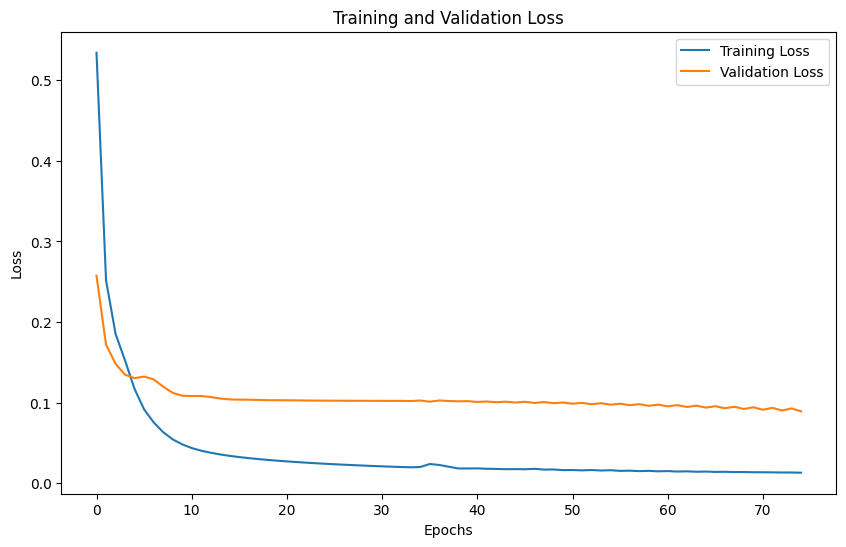

In [121]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt


# Define the LSTM model architecture
def create_lstm_model(input_shape):
    inputs = keras.layers.Input(shape=input_shape)
    lstm_out = keras.layers.LSTM(32)(inputs)

    lstm_out = keras.layers.LSTM(32)(inputs)

    outputs = keras.layers.Dense(1)(lstm_out)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

# Get the input shape from the training data
for batch in dataset_train.take(1):
    inputs_batch, targets_batch = batch
    input_shape = inputs_batch.shape[1:]

# Create the model
model = create_lstm_model(input_shape)

# Compile the model
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mse")

# Display the model architecture
model.summary()

# Train the model
history = model.fit(dataset_train, epochs=epochs, validation_data=dataset_val)

# Evaluate the model
loss = model.evaluate(dataset_val)
print(f"Validation Loss: {loss}")

# Plot training and validation loss over epochs
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


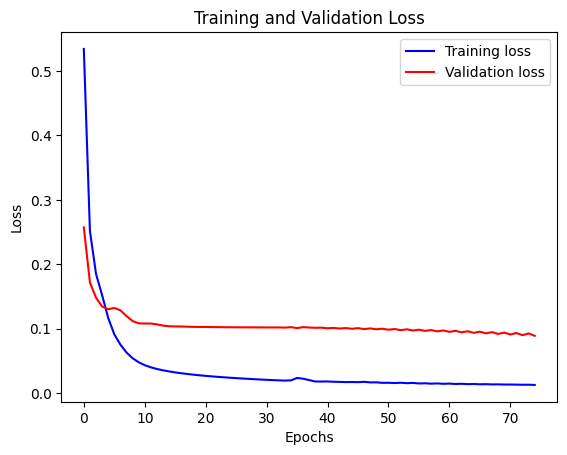

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step  
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


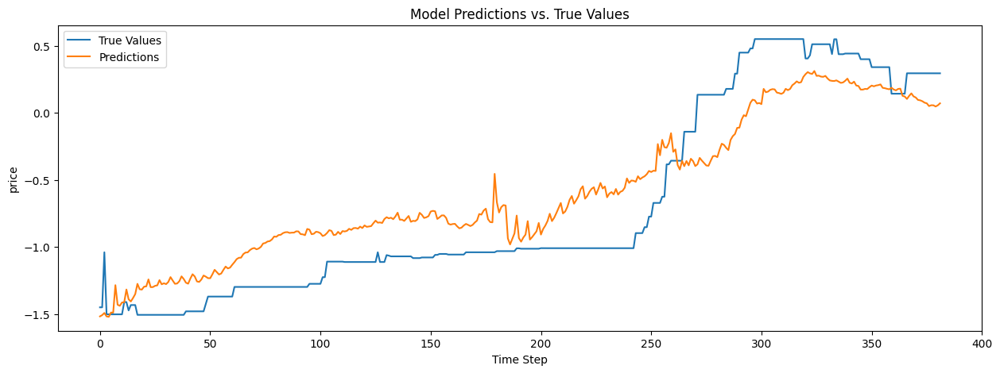

In [122]:
def visualize_loss(history, title):
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs = range(len(loss))
    plt.figure()
    plt.plot(epochs, loss, "b", label="Training loss")
    plt.plot(epochs, val_loss, "r", label="Validation loss")
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

visualize_loss(history, "Training and Validation Loss")

# Prediction and Visualization
def show_plot(plot_data, delta, title):
    labels = ["History", "True Future", "Model Prediction"]
    marker = [".-", "rx", "go"]
    time_steps = list(range(-(plot_data[0].shape[0]), 0))
    future = list(range(1, delta + 1))

    plt.figure(figsize=(10, 6))
    plt.title(title)
    for i, val in enumerate(plot_data):
        if i == 0:
            plt.plot(time_steps, val, marker[i], label=labels[i])
        else:
            plt.plot(future, val, marker[i], markersize=10, label=labels[i])
    plt.legend()
    plt.xlim([time_steps[0], delta])
    plt.xlabel("Time-Step")
    plt.ylabel("Value")
    plt.show()

# Collect predictions and actual values for the entire validation set
predictions_list = []
true_values_list = []

for batch in dataset_val:
    x, y = batch
    predictions = model.predict(x)
    predictions_list.append(predictions)
    true_values_list.append(y)

# Convert lists to numpy arrays
predictions_array = np.concatenate(predictions_list, axis=0)
true_values_array = np.concatenate(true_values_list, axis=0)

# Plot the predictions versus the true values
def plot_predictions(true_values, predictions, title):
    plt.figure(figsize=(15, 5))
    plt.plot(true_values, label="True Values")
    plt.plot(predictions, label="Predictions")
    plt.title(title)
    plt.xlabel("Time Step")
    plt.ylabel("price")
    plt.legend()
    plt.show()

plot_predictions(true_values_array, predictions_array, "Model Predictions vs. True Values")

In [123]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt

def create_lstm_model(input_shape, output_steps):
    inputs = keras.layers.Input(shape=input_shape)
    lstm_out = keras.layers.LSTM(32)(inputs)
    outputs = keras.layers.Dense(output_steps)(lstm_out)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

# Get the input shape from the training data
for batch in dataset_train.take(1):
    inputs_batch, targets_batch = batch
    input_shape = inputs_batch.shape[1:]
    output_steps = targets_batch.shape[1]

model = create_lstm_model(input_shape, output_steps)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mse")
model.summary()


Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_23 (InputLayer)          │ (None, 20, 29)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_53 (LSTM)                       │ (None, 32)                  │           7,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,969 (31.13 KB)

 Trainable params: 7,969 (31.13 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/75
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 1.5625
Epoch 1: val_loss improved from inf to 1.13073, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 1.3413 - val_loss: 1.1307
Epoch 2/75
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.6560
Epoch 2: val_loss improved from 1.13073 to 0.90502, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.6002 - val_loss: 0.9050
Epoch 3/75
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.3369
Epoch 3: val_loss improved from 0.90502 to 0.73313, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.3065 - val_loss: 0.7331
Epoch 4/75
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.2163
Epoch 4: val_loss improved from 0.73313 to 0.61492, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.1863 - val_loss: 0.6149
Epoch 5/75
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1525
Epoch 5: val

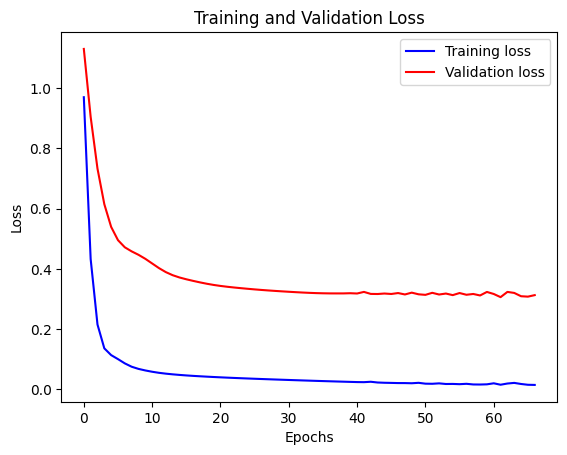

In [124]:
path_checkpoint = "model_checkpoint.weights.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

def visualize_loss(history, title):
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs = range(len(loss))
    plt.figure()
    plt.plot(epochs, loss, "b", label="Training loss")
    plt.plot(epochs, val_loss, "r", label="Validation loss")
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

visualize_loss(history, "Training and Validation Loss")


The selected parameters are: Market Cap (USD), Holders, Price (Sats), Price (USD), Price Change, Volume (1h BTC), Volume (1d BTC), Volume (7d BTC), Volume Total BTC, Sales (1h), Sales (1d), Sales (7d), Sellers (1h), Sellers (1d), Sellers (7d), Buyers (1h), Buyers (1d), Buyers (7d), Listings Min Price, Listings Max Price, Listings Avg Price, Listings Percentile 25, Listings Median Price, Listings Percentile 75, Count Listings, Listings Total Quantity, Balance Change Last 1 Block, Balance Change Last 3 Blocks, Balance Change Last 10 Blocks
Validation data length: 677
x_end: 477
label_start: 1798
label_end: 2375
Number of batches in validation dataset: 2
Validation Input shape: (256, 20, 29)
Validation Target shape: (256, 1)


Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_24 (InputLayer)          │ (None, 20, 29)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_54 (LSTM)                       │ (None, 32)                  │           7,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,969 (31.13 KB)

 Trainable params: 7,969 (31.13 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.4895
Epoch 1: val_loss improved from inf to 0.61080, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 343ms/step - loss: 0.4893 - val_loss: 0.6108
Epoch 2/50
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.4385
Epoch 2: val_loss improved from 0.61080 to 0.58015, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.4389 - val_loss: 0.5802
Epoch 3/50
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.4021
Epoch 3: val_loss improved from 0.58015 to 0.54973, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.4019 - val_loss: 0.5497
Epoch 4/50
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.3722
Epoch 4: val_loss improved from 0.54973 to 0.52078, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.3696 - val_loss: 0.5208
Epoch 5/50
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.3448
Epoch 5: va

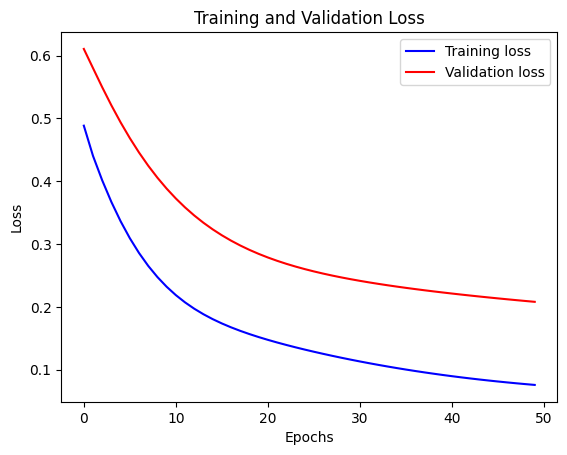

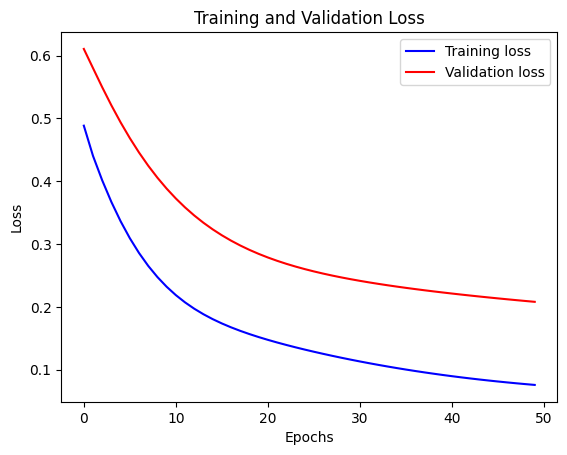

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step  
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


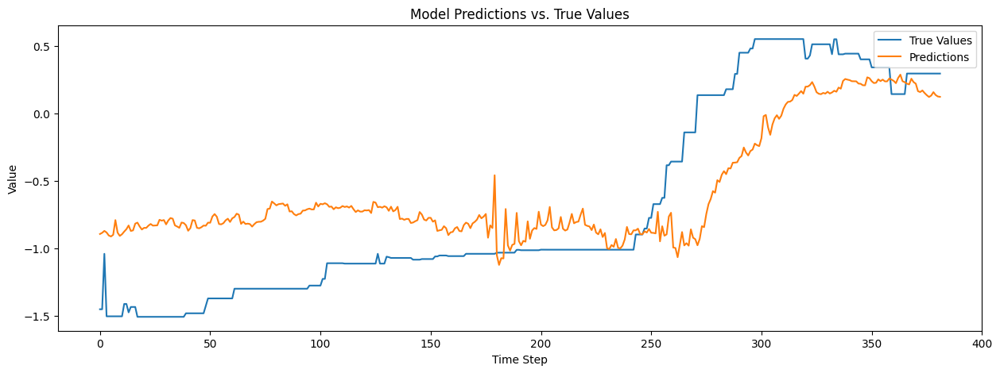

In [125]:

titles = [
    "Market Cap (USD)", "Holders", "Price (Sats)", "Price (USD)", "Price Change",
    "Volume (1h BTC)", "Volume (1d BTC)", "Volume (7d BTC)", "Volume Total BTC",
    "Sales (1h)", "Sales (1d)", "Sales (7d)", "Sellers (1h)", "Sellers (1d)",
    "Sellers (7d)", "Buyers (1h)", "Buyers (1d)", "Buyers (7d)", "Listings Min Price",
    "Listings Max Price", "Listings Avg Price", "Listings Percentile 25",
    "Listings Median Price", "Listings Percentile 75", "Count Listings",
    "Listings Total Quantity", "Balance Change Last 1 Block",
    "Balance Change Last 3 Blocks", "Balance Change Last 10 Blocks"
]

feature_keys = [
    "marketcap_usd", "holders", "price_sats", "price_usd", "price_change",
    "volume_1h_btc", "volume_1d_btc", "volume_7d_btc", "volume_total_btc",
    "sales_1h", "sales_1d", "sales_7d", "sellers_1h", "sellers_1d", "sellers_7d",
    "buyers_1h", "buyers_1d", "buyers_7d", "listings_min_price", "listings_max_price",
    "listings_avg_price", "listings_percentile_25", "listings_median_price",
    "listings_percentile_75", "count_listings", "listings_total_quantity",
    "balance_change_last_1_block", "balance_change_last_3_blocks",
    "balance_change_last_10_blocks"
]

colors = [
    "blue", "orange", "green", "red", "purple", "brown", "pink", "gray", "olive", "cyan",
    "blue", "orange", "green", "red", "purple", "brown", "pink", "gray", "olive", "cyan",
    "blue", "orange", "green", "red", "purple", "brown", "pink", "gray", "olive", "cyan"
]

date_time_key = "timestamp"

# Normalize the data
def normalize(data, train_split):
    data_mean = data[:train_split].mean(axis=0)
    data_std = data[:train_split].std(axis=0)
    data_std[data_std == 0] = 1
    return (data - data_mean) / data_std

split_fraction = 0.715
train_split = int(split_fraction * int(df.shape[0]))
step = 5
past = 100
future_steps = 100
learning_rate = 0.0001
batch_size = 256
epochs = 50

print("The selected parameters are:", ", ".join(titles))
selected_features = feature_keys
features = df[selected_features]
features.index = df[date_time_key]
features.head()

features = normalize(features.values, train_split)
features = pd.DataFrame(features, columns=selected_features)
features.head()

train_data = features.loc[0 : train_split - 1]
val_data = features.loc[train_split:]

# Ensure start and end indices are correctly calculated
start = past
end = train_split

x_train = train_data.values
y_train = features.iloc[start:end][["price_usd"]]

sequence_length = int(past / step)

dataset_train = keras.preprocessing.timeseries_dataset_from_array(
    x_train,
    y_train,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

# Verify the lengths of validation data
print("Validation data length:", len(val_data))
x_end = len(val_data) - past - future_steps
print("x_end:", x_end)

label_start = train_split + past
label_end = len(features)  # End index for validation labels
print("label_start:", label_start)
print("label_end:", label_end)

if x_end > 0 and label_start < label_end:
    x_val = val_data.iloc[:x_end].values
    y_val = features.iloc[label_start:label_end][["price_usd"]].values

    dataset_val = keras.preprocessing.timeseries_dataset_from_array(
        x_val,
        y_val,
        sequence_length=sequence_length,
        sampling_rate=step,
        batch_size=batch_size,
    )

    # Verify that dataset_val is not empty
    print("Number of batches in validation dataset:", len(dataset_val))
    for batch in dataset_val.take(1):
        inputs, targets = batch
        print("Validation Input shape:", inputs.numpy().shape)
        print("Validation Target shape:", targets.numpy().shape)
else:
    print("Insufficient validation data for the given parameters.")

# Define the model
def create_lstm_model(input_shape, output_steps):
    inputs = keras.layers.Input(shape=input_shape)
    lstm_out = keras.layers.LSTM(32)(inputs)
    outputs = keras.layers.Dense(output_steps)(lstm_out)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

# Get the input shape from the training data
for batch in dataset_train.take(1):
    inputs_batch, targets_batch = batch
    input_shape = inputs_batch.shape[1:]
    output_steps = targets_batch.shape[1]

model = create_lstm_model(input_shape, output_steps)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mse")
model.summary()

path_checkpoint = "model_checkpoint.weights.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

def visualize_loss(history, title):
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs = range(len(loss))
    plt.figure()
    plt.plot(epochs, loss, "b", label="Training loss")
    plt.plot(epochs, val_loss, "r", label="Validation loss")
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

visualize_loss(history, "Training and Validation Loss")

# Prediction and Visualization
def visualize_loss(history, title):
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs = range(len(loss))
    plt.figure()
    plt.plot(epochs, loss, "b", label="Training loss")
    plt.plot(epochs, val_loss, "r", label="Validation loss")
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

visualize_loss(history, "Training and Validation Loss")

# Prediction and Visualization
def show_plot(plot_data, delta, title):
    labels = ["History", "True Future", "Model Prediction"]
    marker = [".-", "rx", "go"]
    time_steps = list(range(-(plot_data[0].shape[0]), 0))
    future = list(range(1, delta + 1))

    plt.figure(figsize=(10, 6))
    plt.title(title)
    for i, val in enumerate(plot_data):
        if i == 0:
            plt.plot(time_steps, val, marker[i], label=labels[i])
        else:
            plt.plot(future, val, marker[i], markersize=10, label=labels[i])
    plt.legend()
    plt.xlim([time_steps[0], delta])
    plt.xlabel("Time-Step")
    plt.ylabel("Value")
    plt.show()

# Collect predictions and actual values for the entire validation set
predictions_list = []
true_values_list = []

for batch in dataset_val:
    x, y = batch
    predictions = model.predict(x)
    predictions_list.append(predictions)
    true_values_list.append(y)

# Convert lists to numpy arrays
predictions_array = np.concatenate(predictions_list, axis=0)
true_values_array = np.concatenate(true_values_list, axis=0)

# Plot the predictions versus the true values
def plot_predictions(true_values, predictions, title):
    plt.figure(figsize=(15, 5))
    plt.plot(true_values, label="True Values")
    plt.plot(predictions, label="Predictions")
    plt.title(title)
    plt.xlabel("Time Step")
    plt.ylabel("Value")
    plt.legend()
    plt.show()

plot_predictions(true_values_array, predictions_array, "Model Predictions vs. True Values")

Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_25 (InputLayer)          │ (None, 20, 29)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_55 (LSTM)                       │ (None, 32)                  │           7,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,969 (31.13 KB)

 Trainable params: 7,969 (31.13 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.5386
Epoch 1: val_loss improved from inf to 0.68952, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - loss: 0.5396 - val_loss: 0.6895
Epoch 2/50
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.4903 
Epoch 2: val_loss improved from 0.68952 to 0.65258, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.4913 - val_loss: 0.6526
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.4539
Epoch 3: val_loss improved from 0.65258 to 0.61618, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.4539 - val_loss: 0.6162
Epoch 4/50
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.4207
Epoch 4: val_loss improved from 0.61618 to 0.58131, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.4197 - val_loss: 0.5813
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.3889
Epoch 5:

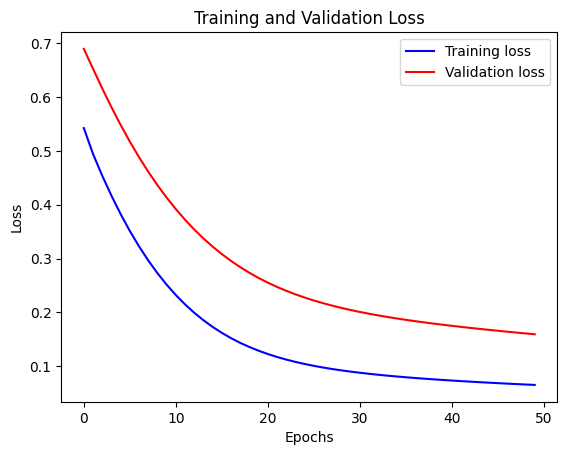

In [126]:


def create_lstm_model(input_shape, output_steps):
    inputs = keras.layers.Input(shape=input_shape)
    lstm_out = keras.layers.LSTM(32)(inputs)
    outputs = keras.layers.Dense(output_steps)(lstm_out)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

# Get the input shape from the training data
for batch in dataset_train.take(1):
    inputs_batch, targets_batch = batch
    input_shape = inputs_batch.shape[1:]
    output_steps = targets_batch.shape[1]

model = create_lstm_model(input_shape, output_steps)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mse")
model.summary()

path_checkpoint = "model_checkpoint.weights.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

def visualize_loss(history, title):
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs = range(len(loss))
    plt.figure()
    plt.plot(epochs, loss, "b", label="Training loss")
    plt.plot(epochs, val_loss, "r", label="Validation loss")
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

visualize_loss(history, "Training and Validation Loss")


The selected parameters are: Market Cap (USD), Holders, Price (Sats), Price (USD), Price Change, Volume (1h BTC), Volume (1d BTC), Volume (7d BTC), Volume Total BTC, Sales (1h), Sales (1d), Sales (7d), Sellers (1h), Sellers (1d), Sellers (7d), Buyers (1h), Buyers (1d), Buyers (7d), Listings Min Price, Listings Max Price, Listings Avg Price, Listings Percentile 25, Listings Median Price, Listings Percentile 75, Listings Total Quantity
Validation data length: 677
x_end: 527
label_start: 1798
label_end: 2375
Number of batches in validation dataset: 2
Validation Input shape: (256, 100, 25)
Validation Target shape: (256, 1)


Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_29 (InputLayer)          │ (None, 100, 25)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_67 (LSTM)                       │ (None, 32)                  │           7,424 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,457 (29.13 KB)

 Trainable params: 7,457 (29.13 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/75
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.6742
Epoch 1: val_loss improved from inf to 0.37420, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.6151 - val_loss: 0.3742
Epoch 2/75
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.2216
Epoch 2: val_loss improved from 0.37420 to 0.15262, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.2039 - val_loss: 0.1526
Epoch 3/75
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1698
Epoch 3: val_loss did not improve from 0.15262
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1575 - val_loss: 0.1631
Epoch 4/75
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0704
Epoch 4: val_loss did not improve from 0.15262
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.0651 - val_loss: 0.2460
Epoch 5/75
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0594
Epoch 5: val_loss did not improve from 0.15262
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.0555 

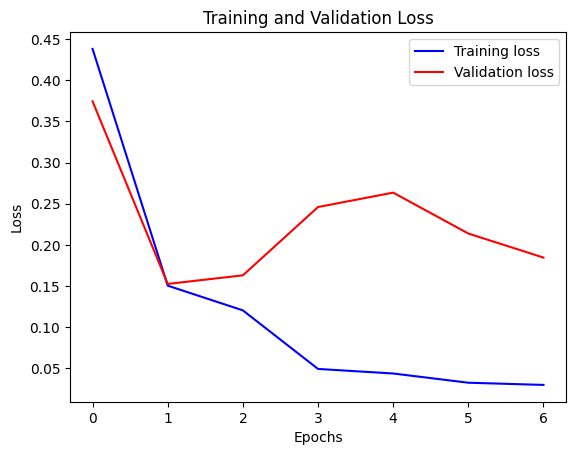

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


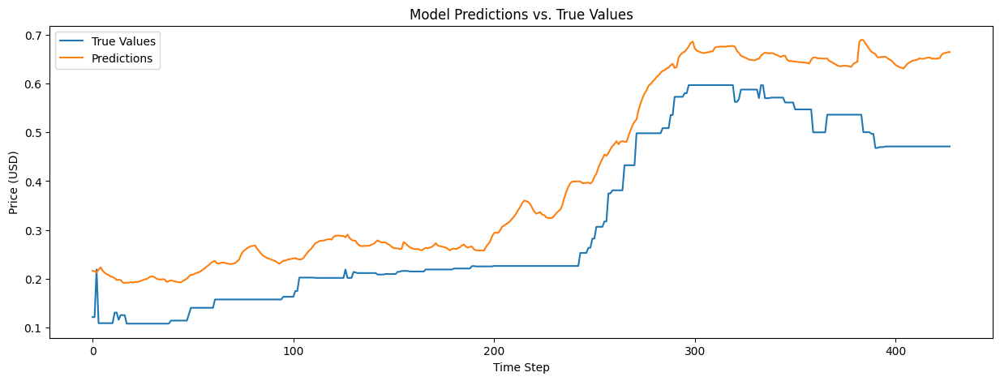

In [132]:
import random

# Ensure random initialization of the seed
seed_value = random.randint(0, 10000)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)
random.seed(seed_value)

# Assuming `df` is your combined DataFrame containing all rune data
# Define the columns to be used
titles = [
    "Market Cap (USD)", "Holders", "Price (Sats)", "Price (USD)", "Price Change",
    "Volume (1h BTC)", "Volume (1d BTC)", "Volume (7d BTC)", "Volume Total BTC",
    "Sales (1h)", "Sales (1d)", "Sales (7d)", "Sellers (1h)", "Sellers (1d)",
    "Sellers (7d)", "Buyers (1h)", "Buyers (1d)", "Buyers (7d)", "Listings Min Price",
    "Listings Max Price", "Listings Avg Price", "Listings Percentile 25",
    "Listings Median Price", "Listings Percentile 75", "Listings Total Quantity"
]

feature_keys = [
    "marketcap_usd", "holders", "price_sats", "price_usd", "price_change",
    "volume_1h_btc", "volume_1d_btc", "volume_7d_btc", "volume_total_btc",
    "sales_1h", "sales_1d", "sales_7d", "sellers_1h", "sellers_1d", "sellers_7d",
    "buyers_1h", "buyers_1d", "buyers_7d", "listings_min_price", "listings_max_price",
    "listings_avg_price", "listings_percentile_25", "listings_median_price",
    "listings_percentile_75", "listings_total_quantity"
]

date_time_key = "timestamp"

# Normalize the data
def normalize(data, train_split):
    data_mean = data[:train_split].mean(axis=0)
    data_std = data[:train_split].std(axis=0)
    data_std[data_std == 0] = 1  # Prevent division by zero
    return (data - data_mean) / data_std, data_mean, data_std

def denormalize(data, mean, std):
    return (data * std) + mean

# Assuming df is already defined as your combined dataframe
split_fraction = 0.715
train_split = int(split_fraction * int(df.shape[0]))
step = 1
past = 100
future_steps = 50
learning_rate = 0.002
batch_size = 256
epochs = 75

print("The selected parameters are:", ", ".join(titles))
selected_features = feature_keys
features = df[selected_features]
features.index = df[date_time_key]
features.head()

# Apply normalization
features, data_mean, data_std = normalize(features.values, train_split)
features = pd.DataFrame(features, columns=selected_features)
features.head()

train_data = features.loc[0 : train_split - 1]
val_data = features.loc[train_split:]

# Ensure start and end indices are correctly calculated
start = past
end = train_split

x_train = train_data.values
y_train = features.iloc[start:end][["price_usd"]]

sequence_length = int(past / step)

dataset_train = keras.preprocessing.timeseries_dataset_from_array(
    x_train,
    y_train,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

# Verify the lengths of validation data
print("Validation data length:", len(val_data))
x_end = len(val_data) - past - future_steps
print("x_end:", x_end)

# Ensure label_start is within bounds and get the correct slice of validation data
label_start = train_split + past
label_end = len(features)  # End index for validation labels
print("label_start:", label_start)
print("label_end:", label_end)

# Debug: Check the ranges for x_val and y_val
if x_end > 0 and label_start < label_end:
    x_val = val_data.iloc[:x_end].values
    y_val = features.iloc[label_start:label_end][["price_usd"]].values  # Slice y_val up to the end

    dataset_val = keras.preprocessing.timeseries_dataset_from_array(
        x_val,
        y_val,
        sequence_length=sequence_length,
        sampling_rate=step,
        batch_size=batch_size,
    )

    # Verify that dataset_val is not empty
    print("Number of batches in validation dataset:", len(dataset_val))
    for batch in dataset_val.take(1):
        inputs, targets = batch
        print("Validation Input shape:", inputs.numpy().shape)
        print("Validation Target shape:", targets.numpy().shape)
else:
    print("Insufficient validation data for the given parameters.")

# Define the model
def create_lstm_model(input_shape, output_steps):
    inputs = keras.layers.Input(shape=input_shape)
    lstm_out = keras.layers.LSTM(32)(inputs)
    # reduce overfitting with a dropout layer
    lstm_out = keras.layers.Dropout(0.02)(lstm_out)
    lstm_out = keras.layers.LSTM(32)(inputs)
    # reduce overfitting with a dropout layer
    lstm_out = keras.layers.LSTM(32)(inputs)

    outputs = keras.layers.Dense(output_steps)(lstm_out)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

# Get the input shape from the training data
for batch in dataset_train.take(1):
    inputs_batch, targets_batch = batch
    input_shape = inputs_batch.shape[1:]
    output_steps = targets_batch.shape[1]

model = create_lstm_model(input_shape, output_steps)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mse")
model.summary()

path_checkpoint = "model_checkpoint.weights.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

def visualize_loss(history, title):
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs = range(len(loss))
    plt.figure()
    plt.plot(epochs, loss, "b", label="Training loss")
    plt.plot(epochs, val_loss, "r", label="Validation loss")
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

visualize_loss(history, "Training and Validation Loss")

# Prediction and Visualization
def show_plot(plot_data, delta, title):
    labels = ["History", "True Future", "Model Prediction"]
    marker = [".-", "rx", "go"]
    time_steps = list(range(-(plot_data[0].shape[0]), 0))
    future = list(range(1, delta + 1))

    plt.figure(figsize=(10, 6))
    plt.title(title)
    for i, val in enumerate(plot_data):
        if i == 0:
            plt.plot(time_steps, val, marker[i], label=labels[i])
        else:
            plt.plot(future, val, marker[i], markersize=10, label=labels[i])
    plt.legend()
    plt.xlim([time_steps[0], delta])
    plt.xlabel("Time-Step")
    plt.ylabel("Price (USD)")
    plt.show()

# Collect predictions and actual values for the entire validation set
predictions_list = []
true_values_list = []

for batch in dataset_val:
    x, y = batch
    predictions = model.predict(x)
    predictions_list.append(predictions)
    true_values_list.append(y)

# Convert lists to numpy arrays
predictions_array = np.concatenate(predictions_list, axis=0)
true_values_array = np.concatenate(true_values_list, axis=0)

# Denormalize predictions and true values
denorm_predictions = denormalize(predictions_array, data_mean[feature_keys.index('price_usd')], data_std[feature_keys.index('price_usd')])
denorm_true_values = denormalize(true_values_array, data_mean[feature_keys.index('price_usd')], data_std[feature_keys.index('price_usd')])

# Plot the predictions versus the true values
def plot_predictions(true_values, predictions, title):
    plt.figure(figsize=(15, 5))
    plt.plot(true_values, label="True Values")
    plt.plot(predictions, label="Predictions")
    plt.title(title)
    plt.xlabel("Time Step")
    plt.ylabel("Price (USD)")
    plt.legend()
    plt.show()

plot_predictions(denorm_true_values, denorm_predictions, "Model Predictions vs. True Values")


In [139]:
def plot_training_and_predictions(train_data, true_values, predictions, title):
    fig = go.Figure()

    # Add traces for training data
    fig.add_trace(go.Scatter(
        x=list(range(len(train_data))),
        y=train_data.flatten(),
        mode='lines',
        name='Training Data'
    ))

    # Add traces for validation data (true)
    fig.add_trace(go.Scatter(
        x=list(range(len(train_data), len(train_data) + len(true_values))),
        y=true_values.flatten(),
        mode='lines',
        name='Validation Data (True)'
    ))

    # Add traces for validation data (predicted)
    fig.add_trace(go.Scatter(
        x=list(range(len(train_data), len(train_data) + len(predictions))),
        y=predictions.flatten(),
        mode='lines',
        name='Validation Data (Predicted)'
    ))

    # Update layout
    fig.update_layout(
        title=title,
        xaxis_title='Time Step',
        yaxis_title='Price (USD)',
        legend_title='Legend'
    )

    fig.show()

plot_training_and_predictions(denorm_train_data, denorm_true_values, denorm_predictions, "Training Data and Model Predictions vs. True Values")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━

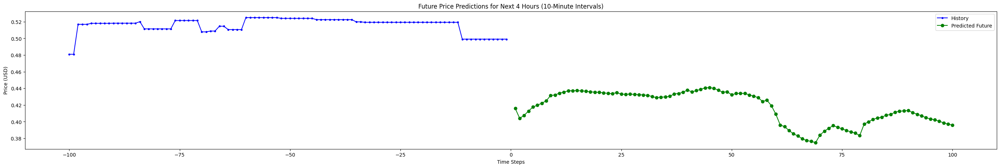

In [142]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow import keras

# Get the latest data for prediction
latest_sequence = features.iloc[-sequence_length:].values
latest_sequence = np.expand_dims(latest_sequence, axis=0)

# Predict the next 24 steps (4 hours with 10-minute intervals)
num_predictions = 100
predicted_prices = []

current_sequence = latest_sequence

for _ in range(num_predictions):
    prediction = model.predict(current_sequence)
    predicted_prices.append(prediction.flatten())

    # Update the current sequence by adding the latest prediction and removing the oldest data point
    current_sequence = np.roll(current_sequence, -1, axis=1)
    current_sequence[0, -1, feature_keys.index('price_usd')] = prediction

# Denormalize the predictions
denorm_predicted_prices = denormalize(np.array(predicted_prices), data_mean[feature_keys.index('price_usd')], data_std[feature_keys.index('price_usd')])
denorm_predicted_prices = denorm_predicted_prices.flatten()

def plot_future_predictions(latest_data, predictions, title):
    time_steps = list(range(-sequence_length, 0, 1))
    future_steps = list(range(1, len(predictions) + 1, 1))

    plt.figure(figsize=(35, 5))
    plt.plot(time_steps, latest_data, "b.-", label="History")
    plt.plot(future_steps, predictions, "go-", label="Predicted Future")
    plt.xlabel("Time Steps")
    plt.ylabel("Price (USD)")
    plt.title(title)
    plt.legend()
    plt.show()

# Get the latest price data in original scale for visualization
denorm_latest_data = denormalize(features.iloc[-sequence_length:][["price_usd"]].values, data_mean[feature_keys.index('price_usd')], data_std[feature_keys.index('price_usd')]).flatten()

# Plot the future predictions
plot_future_predictions(denorm_latest_data, denorm_predicted_prices, "Future Price Predictions for Next 4 Hours (10-Minute Intervals)")


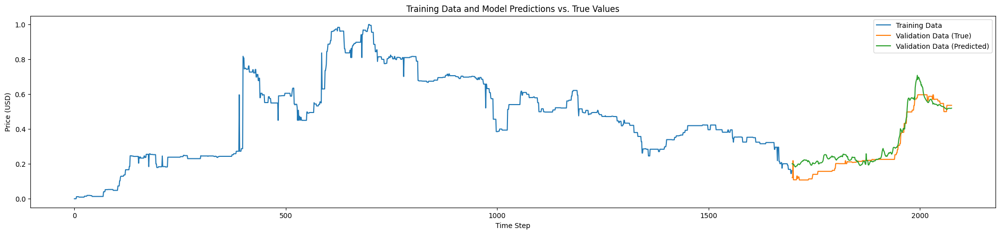

In [145]:
def plot_training_and_predictions(train_data, true_values, predictions, title):
    plt.figure(figsize=(25, 5))
    plt.plot(range(len(train_data)), train_data, label="Training Data")
    plt.plot(range(len(train_data), len(train_data) + len(true_values)), true_values, label="Validation Data (True)")
    plt.plot(range(len(train_data), len(train_data) + len(predictions)), predictions, label="Validation Data (Predicted)")
    plt.title(title)
    plt.xlabel("Time Step")
    plt.ylabel("Price (USD)")
    plt.legend()
    plt.show()

# Denormalize training data
denorm_train_data = denormalize(train_data[["price_usd"]].values, data_mean[feature_keys.index('price_usd')], data_std[feature_keys.index('price_usd')])

plot_training_and_predictions(denorm_train_data, denorm_true_values, denorm_predictions, "Training Data and Model Predictions vs. True Values")


In [146]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Calculate MAE and RMSE
mae = mean_absolute_error(denorm_true_values, denorm_predictions)
rmse = mean_squared_error(denorm_true_values, denorm_predictions, squared=False)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")


Mean Absolute Error (MAE): 0.043878442142677505
Root Mean Squared Error (RMSE): 0.05422167432294287


The selected parameters are: Market Cap (USD), Holders, Price (Sats), Price (USD), Price Change, Volume (1h BTC), Volume (1d BTC), Volume (7d BTC), Volume Total BTC, Sales (1h), Sales (1d), Sales (7d), Sellers (1h), Sellers (1d), Sellers (7d), Buyers (1h), Buyers (1d), Buyers (7d), Listings Min Price, Listings Max Price, Listings Avg Price, Listings Percentile 25, Listings Median Price, Listings Percentile 75, Count Listings, Listings Total Quantity, Balance Change Last 1 Block, Balance Change Last 3 Blocks, Balance Change Last 10 Blocks
Validation data length: 677
x_end: 477
label_start: 1798
label_end: 2375
Number of batches in validation dataset: 2
Validation Input shape: (256, 20, 29)
Validation Target shape: (256, 1)


Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_26 (InputLayer)          │ (None, 20, 29)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_58 (LSTM)                       │ (None, 32)                  │           7,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,969 (31.13 KB)

 Trainable params: 7,969 (31.13 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
6/7 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.7130
Epoch 1: val_loss improved from inf to 0.08606, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.6654 - val_loss: 0.0861
Epoch 2/50
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.8163
Epoch 2: val_loss did not improve from 0.08606
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.7714 - val_loss: 0.1615
Epoch 3/50
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.3248
Epoch 3: val_loss did not improve from 0.08606
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.2852 - val_loss: 0.1183
Epoch 4/50
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.1963
Epoch 4: val_loss did not improve from 0.08606
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.1933 - val_loss: 0.0976
Epoch 5/50
5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0868
Epoch 5: val_loss improved from 0.08606 to 0.08100, saving model to model_checkpoint.weights.h5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0934 - val_loss

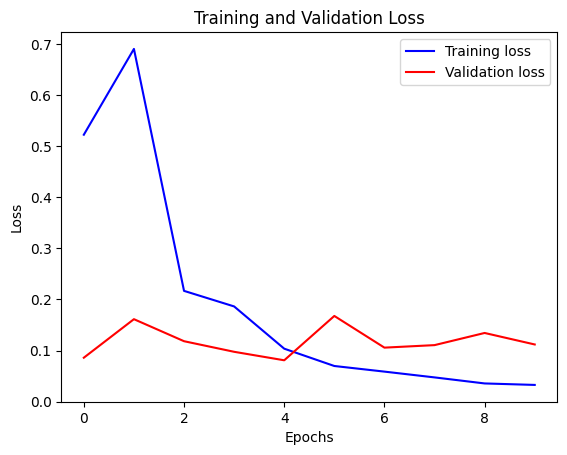

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step  
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


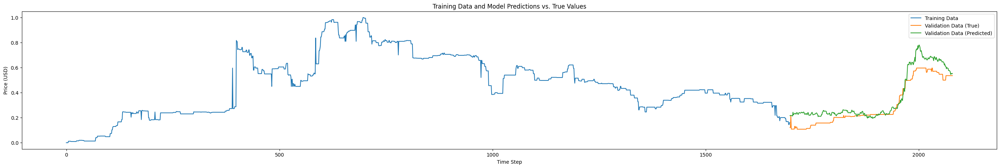

Mean Absolute Error (MAE): 0.06491938597419505
Root Mean Squared Error (RMSE): 0.07948763186324391


In [129]:
import pandas as pd
import numpy as np
from tensorflow import keras
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Ensure random initialization of the seed
np.random.seed(42)
tf.random.set_seed(42)

# Defining The Features Selected
titles = [
    "Market Cap (USD)", "Holders", "Price (Sats)", "Price (USD)", "Price Change",
    "Volume (1h BTC)", "Volume (1d BTC)", "Volume (7d BTC)", "Volume Total BTC",
    "Sales (1h)", "Sales (1d)", "Sales (7d)", "Sellers (1h)", "Sellers (1d)",
    "Sellers (7d)", "Buyers (1h)", "Buyers (1d)", "Buyers (7d)", "Listings Min Price",
    "Listings Max Price", "Listings Avg Price", "Listings Percentile 25",
    "Listings Median Price", "Listings Percentile 75", "Count Listings",
    "Listings Total Quantity", "Balance Change Last 1 Block",
    "Balance Change Last 3 Blocks", "Balance Change Last 10 Blocks"
]

feature_keys = [
    "marketcap_usd", "holders", "price_sats", "price_usd", "price_change",
    "volume_1h_btc", "volume_1d_btc", "volume_7d_btc", "volume_total_btc",
    "sales_1h", "sales_1d", "sales_7d", "sellers_1h", "sellers_1d", "sellers_7d",
    "buyers_1h", "buyers_1d", "buyers_7d", "listings_min_price", "listings_max_price",
    "listings_avg_price", "listings_percentile_25", "listings_median_price",
    "listings_percentile_75", "count_listings", "listings_total_quantity",
    "balance_change_last_1_block", "balance_change_last_3_blocks",
    "balance_change_last_10_blocks"
]

date_time_key = "timestamp"

# Data Normalized
def normalize(data, train_split):
    data_mean = data[:train_split].mean(axis=0)
    data_std = data[:train_split].std(axis=0)
    data_std[data_std == 0] = 1  # Prevent division by zero
    return (data - data_mean) / data_std, data_mean, data_std

def denormalize(data, mean, std):
    return (data * std) + mean

# Data parameters
split_fraction = 0.715
train_split = int(split_fraction * int(df.shape[0]))
# Setting the time features
step = 5
past = 100
future_steps = 100
# Learning rate and batch size
learning_rate = 0.02
batch_size = 256
epochs = 50

print("The selected parameters are:", ", ".join(titles))
selected_features = feature_keys
features = df[selected_features]
features.index = df[date_time_key]
features.head()

# Apply normalization
features, data_mean, data_std = normalize(features.values, train_split)
features = pd.DataFrame(features, columns=selected_features)
features.head()

train_data = features.loc[0 : train_split - 1]
val_data = features.loc[train_split:]

# Ensure start and end indices are correctly calculated
start = past
end = train_split

x_train = train_data.values
y_train = features.iloc[start:end][["price_usd"]]

sequence_length = int(past / step)

dataset_train = keras.preprocessing.timeseries_dataset_from_array(
    x_train,
    y_train,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

# Verify the lengths of validation data
print("Validation data length:", len(val_data))
x_end = len(val_data) - past - future_steps
print("x_end:", x_end)

label_start = train_split + past
label_end = len(features)
print("label_start:", label_start)
print("label_end:", label_end)

if x_end > 0 and label_start < label_end:
    x_val = val_data.iloc[:x_end].values
    y_val = features.iloc[label_start:label_end][["price_usd"]].values

    dataset_val = keras.preprocessing.timeseries_dataset_from_array(
        x_val,
        y_val,
        sequence_length=sequence_length,
        sampling_rate=step,
        batch_size=batch_size,
    )

    # Verify that dataset_val is not empty
    print("Number of batches in validation dataset:", len(dataset_val))
    for batch in dataset_val.take(1):
        inputs, targets = batch
        print("Validation Input shape:", inputs.numpy().shape)
        print("Validation Target shape:", targets.numpy().shape)
else:
    print("Insufficient validation data for the given parameters.")

# Define the model
def create_lstm_model(input_shape, output_steps):
    inputs = keras.layers.Input(shape=input_shape)
    lstm_out = keras.layers.LSTM(32)(inputs)
    # Reduce overfitting with a dropout layer
    lstm_out = keras.layers.Dropout(0.02)(lstm_out)
    lstm_out = keras.layers.LSTM(64)(inputs)
    # Reduce overfitting with a dropout layer
    lstm_out = keras.layers.LSTM(32)(inputs)
    outputs = keras.layers.Dense(output_steps)(lstm_out)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

# Get the input shape from the training data
for batch in dataset_train.take(1):
    inputs_batch, targets_batch = batch
    input_shape = inputs_batch.shape[1:]
    output_steps = targets_batch.shape[1]

model = create_lstm_model(input_shape, output_steps)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mse")
model.summary()

path_checkpoint = "model_checkpoint.weights.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

# Visualize training and validation loss
def visualize_loss(history, title):
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs = range(len(loss))
    plt.figure()
    plt.plot(epochs, loss, "b", label="Training loss")
    plt.plot(epochs, val_loss, "r", label="Validation loss")
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

visualize_loss(history, "Training and Validation Loss")

# Prediction and Visualization
def show_plot(plot_data, delta, title):
    labels = ["History", "True Future", "Model Prediction"]
    marker = [".-", "rx", "go"]
    time_steps = list(range(-(plot_data[0].shape[0]), 0))
    future = list(range(1, delta + 1))

    plt.figure(figsize=(10, 6))
    plt.title(title)
    for i, val in enumerate(plot_data):
        if i == 0:
            plt.plot(time_steps, val, marker[i], label=labels[i])
        else:
            plt.plot(future, val, marker[i], markersize=10, label=labels[i])
    plt.legend()
    plt.xlim([time_steps[0], delta])
    plt.xlabel("Time-Step")
    plt.ylabel("Price (USD)")
    plt.show()

# Collect predictions and actual values for the entire validation set
predictions_list = []
true_values_list = []

for batch in dataset_val:
    x, y = batch
    predictions = model.predict(x)
    predictions_list.append(predictions)
    true_values_list.append(y)

# Convert lists to numpy arrays
predictions_array = np.concatenate(predictions_list, axis=0)
true_values_array = np.concatenate(true_values_list, axis=0)

# Denormalize predictions and true values
denorm_predictions = denormalize(predictions_array, data_mean[feature_keys.index('price_usd')], data_std[feature_keys.index('price_usd')])
denorm_true_values = denormalize(true_values_array, data_mean[feature_keys.index('price_usd')], data_std[feature_keys.index('price_usd')])

# Plot the training, validation data, and predictions
def plot_training_and_predictions(train_data, true_values, predictions, title):
    plt.figure(figsize=(35, 5))
    plt.plot(range(len(train_data)), train_data[:, feature_keys.index('price_usd')], label="Training Data")
    plt.plot(range(len(train_data), len(train_data) + len(true_values)), true_values, label="Validation Data (True)")
    plt.plot(range(len(train_data), len(train_data) + len(predictions)), predictions, label="Validation Data (Predicted)")
    plt.title(title)
    plt.xlabel("Time Step")
    plt.ylabel("Price (USD)")
    plt.legend()
    plt.show()

# Denormalize training data
denorm_train_data = denormalize(train_data.values, data_mean[feature_keys.index('price_usd')], data_std[feature_keys.index('price_usd')])

plot_training_and_predictions(denorm_train_data, denorm_true_values, denorm_predictions, "Training Data and Model Predictions vs. True Values")

# Calculate error metrics
mae = mean_absolute_error(denorm_true_values, denorm_predictions)
rmse = mean_squared_error(denorm_true_values, denorm_predictions, squared=False)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")


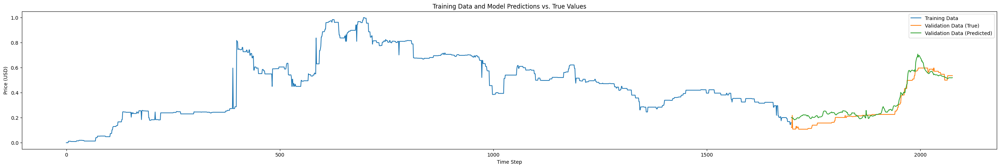

In [147]:
import matplotlib.pyplot as plt

# Plot the training, validation data, and predictions
def plot_training_and_predictions(train_data, true_values, predictions, title):
    plt.figure(figsize=(35, 5))
    plt.plot(range(len(train_data)), train_data[:, feature_keys.index('price_usd')], label="Training Data")
    plt.plot(range(len(train_data), len(train_data) + len(true_values)), true_values, label="Validation Data (True)")
    plt.plot(range(len(train_data), len(train_data) + len(predictions)), predictions, label="Validation Data (Predicted)")
    plt.title(title)
    plt.xlabel("Time Step")
    plt.ylabel("Price (USD)")
    plt.legend()
    plt.show()

# Denormalize training data
denorm_train_data = denormalize(train_data.values, data_mean[feature_keys.index('price_usd')], data_std[feature_keys.index('price_usd')])

plot_training_and_predictions(denorm_train_data, denorm_true_values, denorm_predictions, "Training Data and Model Predictions vs. True Values")


In [148]:
from sklearn.model_selection import TimeSeriesSplit

# Define the time series split
tscv = TimeSeriesSplit(n_splits=5)

mae_scores = []
rmse_scores = []

for train_index, val_index in tscv.split(features):
    train_features, val_features = features.iloc[train_index], features.iloc[val_index]
    train_target, val_target = target.iloc[train_index], target.iloc[val_index]

    # Create time series data
    x_train, y_train = create_time_series_data(train_features, train_target, time_steps)
    x_val, y_val = create_time_series_data(val_features, val_target, time_steps)

    # Define and compile the model
    model = create_lstm_model((x_train.shape[1], x_train.shape[2]), output_steps)
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mse")

    # Train the model
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(x_val, y_val), verbose=0)

    # Predict and evaluate
    y_pred = model.predict(x_val)
    y_pred_rescaled = target_scaler.inverse_transform(y_pred)
    y_val_rescaled = target_scaler.inverse_transform(y_val.reshape(-1, 1))

    # Calculate MAE and RMSE
    mae_scores.append(mean_absolute_error(y_val_rescaled, y_pred_rescaled))
    rmse_scores.append(mean_squared_error(y_val_rescaled, y_pred_rescaled, squared=False))

print(f"Cross-Validated MAE: {np.mean(mae_scores)}, std: {np.std(mae_scores)}")
print(f"Cross-Validated RMSE: {np.mean(rmse_scores)}, std: {np.std(rmse_scores)}")


10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Cross-Validated MAE: 0.2846961426759592, std: 0.1998533188794528
Cross-Validated RMSE: 0.33840198168708646, std: 0.24689646205101148
